Requirments

In [54]:
!apt-get update
!apt-get install ffmpeg -y

Get:1 https://cloud.r-project.org/bin/linux/ubuntu jammy-cran40/ InRelease [3,626 B]
Get:2 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu2204/x86_64  InRelease [1,581 B]
Get:3 http://security.ubuntu.com/ubuntu jammy-security InRelease [129 kB]
Ign:4 https://r2u.stat.illinois.edu/ubuntu jammy InRelease
Get:5 https://r2u.stat.illinois.edu/ubuntu jammy Release [5,713 B]
Hit:6 http://archive.ubuntu.com/ubuntu jammy InRelease
Get:7 https://r2u.stat.illinois.edu/ubuntu jammy Release.gpg [793 B]
Get:8 http://archive.ubuntu.com/ubuntu jammy-updates InRelease [128 kB]
Get:9 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu2204/x86_64  Packages [1,031 kB]
Hit:10 http://archive.ubuntu.com/ubuntu jammy-backports InRelease
Get:11 https://ppa.launchpadcontent.net/deadsnakes/ppa/ubuntu jammy InRelease [18.1 kB]
Hit:12 https://ppa.launchpadcontent.net/graphics-drivers/ppa/ubuntu jammy InRelease
Get:13 https://r2u.stat.illinois.edu/ubuntu jammy/main amd64 Packages [2,593 

In [4]:
!pip install plotly

In [5]:
!pip install bar_chart_race

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 156.8/156.8 kB 4.7 MB/s eta 0:00:00


In [7]:
import plotly.express as px
import pandas as pd
import bar_chart_race as bcr
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import re

## **Task 1**

In [8]:
file_path = '/content/dataset.csv'
df = pd.read_csv(file_path)
df.head()

,VIN (1-10),County,City,State,Postal Code,Model Year,Make,Model,Electric Vehicle Type,Clean Alternative Fuel Vehicle (CAFV) Eligibility,Electric Range,Base MSRP,Legislative District,DOL Vehicle ID,Vehicle Location,Electric Utility,2020 Census Tract
0,JTMEB3FV6N,Monroe,Key West,FL,33040,2022,TOYOTA,RAV4 PRIME,Plug-in Hybrid Electric Vehicle (PHEV),Clean Alternative Fuel Vehicle Eligible,42,0,NaN,198968248,POINT (-81.80023 24.5545),NaN,12087972100
1,1G1RD6E45D,Clark,Laughlin,NV,89029,2013,CHEVROLET,VOLT,Plug-in Hybrid Electric Vehicle (PHEV),Clean Alternative Fuel Vehicle Eligible,38,0,NaN,5204412,POINT (-114.57245 35.16815),NaN,32003005702
2,JN1AZ0CP8B,Yakima,Yakima,WA,98901,2011,NISSAN,LEAF,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,73,0,15.0,218972519,POINT (-120.50721 46.60448),PACIFICORP,53077001602
3,1G1FW6S08H,Skagit,Concrete,WA,98237,2017,CHEVROLET,BOLT EV,Battery Electric Vehicle (BEV),Clean Alternative Fuel Vehicle Eligible,238,0,39.0,186750406,POINT (-121.7515 48.53892),PUGET SOUND ENERGY INC,53057951101
4,3FA6P0SU1K,Snohomish,Everett,WA,98201,2019,FORD,FUSION,Plug-in Hybrid Electric Vehicle (PHEV),Not eligible due to low battery range,26,0,38.0,2006714,POINT (-122.20596 47.97659),PUGET SOUND ENERGY INC,53061041500


In [9]:
df.rename(columns={'Clean Alternative Fuel Vehicle (CAFV) Eligibility': 'CAFV'}, inplace=True)
# rename col Electric Vehicle Type -> EV Type
df.rename(columns={'Electric Vehicle Type': 'EV Type'}, inplace=True)

**Univariate Analysis**

In [10]:
(df['Base MSRP'] <= 0).sum()

109122

In [11]:
df['Model Year'].unique()

array([2022, 2013, 2011, 2017, 2019, 2018, 2016, 2020, 2021, 2015, 2014,
       2012, 2023, 2010, 2008, 2000, 1997, 1999, 1998, 2002])

In [12]:
df['Legislative District'].unique()

array([nan, 15., 39., 38.,  1., 21., 10., 40., 22., 13., 20.,  2., 32.,
        7., 46., 30., 35., 44., 14.,  9.,  3., 23., 24.,  5., 33., 45.,
       19., 27., 26., 25., 43., 17.,  6., 41., 37., 34., 31., 12., 28.,
       48., 49.,  4., 29., 36., 42.,  8., 18., 11., 16., 47.])

In [13]:
df['EV Type'] = df['EV Type'].replace({
    'Battery Electric Vehicle (BEV)': 'Battery EV',
    'Plug-in Hybrid Electric Vehicle (PHEV)': 'Plug-in Hybrid EV'
})

In [14]:
df['CAFV'].unique()

array(['Clean Alternative Fuel Vehicle Eligible',
       'Not eligible due to low battery range',
       'Eligibility unknown as battery range has not been researched'],
      dtype=object)

In [15]:
df['CAFV'] = df['CAFV'].replace({'Clean Alternative Fuel Vehicle Eligible': 'Eligible',
                                  'Not eligible due to low battery range': 'Not Eligible',
                                  'Eligibility unknown as battery range has not been researched': 'Unknown'})

In [16]:
tmpdf = df.copy()

<Axes: >

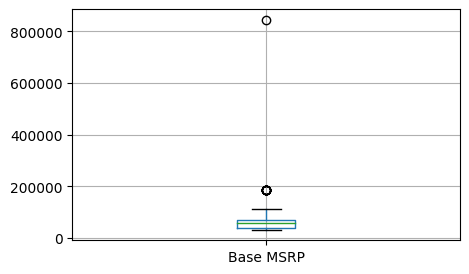

In [17]:
# box plot 'Base MSRP'
tmpdf[tmpdf['Base MSRP'] > 0].boxplot(column=['Base MSRP'], figsize=(5, 3))

In [18]:
basemsrp_nonzero = tmpdf[tmpdf['Base MSRP'] > 0]
q1, q3 = basemsrp_nonzero['Base MSRP'].quantile([0.25, 0.75])
iqr = q3 - q1
lwr_fence = max(basemsrp_nonzero['Base MSRP'].min(), q1-1.5*iqr)
upr_fence = q3+1.5*iqr
print("base msrp:", {
    'median': basemsrp_nonzero['Base MSRP'].median(),
    'min': basemsrp_nonzero['Base MSRP'].min(),
    'max': basemsrp_nonzero['Base MSRP'].max(),
    'lwr_fence': lwr_fence,
    'upr_fence': upr_fence
})

base msrp: {'median': 59900.0, 'min': 31950, 'max': 845000, 'lwr_fence': 31950, 'upr_fence': 114757.5}


In [19]:
tmpdf.loc[tmpdf['Base MSRP'] <= 0, 'Base MSRP'] = np.random.randint(lwr_fence, upr_fence, size=tmpdf[tmpdf['Base MSRP'] <= 0].shape[0])
tmpdf[tmpdf['Base MSRP'] <= 0].shape[0]

0

<Axes: >

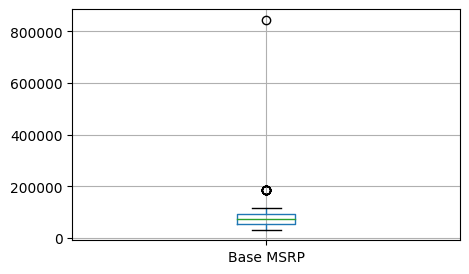

In [20]:
tmpdf.boxplot(column=['Base MSRP'], figsize=(5, 3))

In [21]:
basemsrp_nonzero = tmpdf[tmpdf['Electric Range'] > 0]
q1, q3 = basemsrp_nonzero['Electric Range'].quantile([0.25, 0.75])
iqr = q3 - q1
lwr_fence = max(basemsrp_nonzero['Electric Range'].min(), q1-1.5*iqr)
upr_fence = q3+1.5*iqr
print("electric range:", {
    'median': basemsrp_nonzero['Electric Range'].median(),
    'min': basemsrp_nonzero['Electric Range'].min(),
    'max': basemsrp_nonzero['Electric Range'].max(),
    'lwr_fence': lwr_fence,
    'upr_fence': upr_fence
})

electric range: {'median': 100.0, 'min': 6, 'max': 337, 'lwr_fence': 6, 'upr_fence': 497.5}


<Axes: >

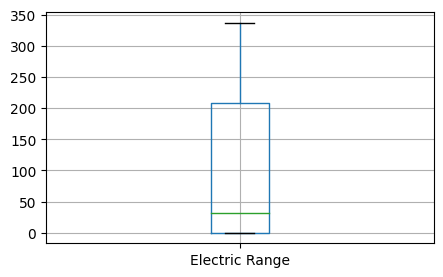

In [22]:
tmpdf.boxplot(column=['Electric Range'], figsize=(5, 3))

In [23]:
TO_BE_DROPPED = [
    'VIN (1-10)',           # some sort of uid
    'Legislative District', # legislative district code, depends on state
    'DOL Vehicle ID',       # again, some sort of uid
    '2020 Census Tract',    # census tract code
    'Electric Utility'      # won't use
]
tmpdf.drop(columns=TO_BE_DROPPED, inplace=True)

In [24]:
tmpdf.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 112634 entries, 0 to 112633
Data columns (total 12 columns):
 #   Column            Non-Null Count   Dtype 
---  ------            --------------   ----- 
 0   County            112634 non-null  object
 1   City              112634 non-null  object
 2   State             112634 non-null  object
 3   Postal Code       112634 non-null  int64 
 4   Model Year        112634 non-null  int64 
 5   Make              112634 non-null  object
 6   Model             112614 non-null  object
 7   EV Type           112634 non-null  object
 8   CAFV              112634 non-null  object
 9   Electric Range    112634 non-null  int64 
 10  Base MSRP         112634 non-null  int64 
 11  Vehicle Location  112610 non-null  object
dtypes: int64(4), object(8)
memory usage: 10.3+ MB


In [25]:
tmpdf.fillna({'Model': 'Unknown'}, inplace=True)
tmpdf['Model'].isna().sum()

0

In [26]:
tmpdf['Postal Code'] = tmpdf['Postal Code'].astype(str)
tmpdf['Model Year'] = tmpdf['Model Year'].astype(str)

In [27]:

tmpdf['Vehicle Location'][0]

'POINT (-81.80023 24.5545)'

In [28]:
pattern = r"POINT\s\(-?\d+\.\d+\s-?\d+\.\d+\)"
tmpdf['Vehicle Location'].str.contains(pattern, regex=True).sum()

112610

In [29]:
def fill_na_vehicle_location(row):
  if pd.notna(row['Vehicle Location']):
    return row['Vehicle Location']
  else:
    lat = np.random.uniform(30, 50)  # Replace with your desired latitude range
    lon = np.random.uniform(-125, -70) # Replace with your desired longitude range
    return f"POINT ({lat} {lon})"

tmpdf['Vehicle Location'] = tmpdf.apply(fill_na_vehicle_location, axis=1)

In [30]:
pattern = r"POINT\s*\(\s*-?\d+\.\d+\s+-?\d+\.\d+\s*\)"
tmpdf['Vehicle Location'].str.contains(pattern, regex=True).sum()

112634

In [31]:
def extract_lat_lon(location_str):
    location_str = location_str.replace('POINT (', '')  # replace 'POINT (' with ''
    location_str = location_str.replace(')', '')        # replace ')' with ''
    lat, lon = location_str.split()                     # split on space into lat, lon
    return float(lat), float(lon)

tmpdf[['Loc Lat', 'Loc Lon']] = tmpdf['Vehicle Location'].apply(lambda x: pd.Series(extract_lat_lon(x)))
tmpdf.drop(columns=['Vehicle Location'], inplace=True)

In [32]:
tmpdf.head()

,County,City,State,Postal Code,Model Year,Make,Model,EV Type,CAFV,Electric Range,Base MSRP,Loc Lat,Loc Lon
0,Monroe,Key West,FL,33040,2022,TOYOTA,RAV4 PRIME,Plug-in Hybrid EV,Eligible,42,46917,-81.80023,24.55450
1,Clark,Laughlin,NV,89029,2013,CHEVROLET,VOLT,Plug-in Hybrid EV,Eligible,38,110069,-114.57245,35.16815
2,Yakima,Yakima,WA,98901,2011,NISSAN,LEAF,Battery EV,Eligible,73,83560,-120.50721,46.60448
3,Skagit,Concrete,WA,98237,2017,CHEVROLET,BOLT EV,Battery EV,Eligible,238,81981,-121.75150,48.53892
4,Snohomish,Everett,WA,98201,2019,FORD,FUSION,Plug-in Hybrid EV,Not Eligible,26,51558,-122.20596,47.97659


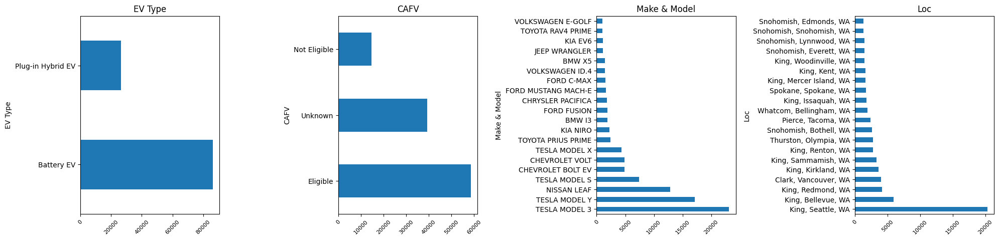

In [33]:
tmpdef_joined_mk_mod = tmpdf.copy()
tmpdef_joined_mk_mod['Make & Model'] = tmpdef_joined_mk_mod['Make'] + ' ' + tmpdef_joined_mk_mod['Model']
# drop make and model
tmpdef_joined_mk_mod.drop(columns=['Make', 'Model'], inplace=True)
# join County, City, State
tmpdef_joined_mk_mod['Loc'] = tmpdef_joined_mk_mod['County'] + ', ' + tmpdef_joined_mk_mod['City'] + ', ' + tmpdef_joined_mk_mod['State']
# drop County, City, State
tmpdef_joined_mk_mod.drop(columns=['County', 'City', 'State'], inplace=True)
# drop Postal Code, Model Year
tmpdef_joined_mk_mod.drop(columns=['Postal Code', 'Model Year'], inplace=True)
categorical_columns = tmpdef_joined_mk_mod.select_dtypes(include=['object']).columns

num_rows = 2
fig, axes = plt.subplots(num_rows, 4, figsize=(20, 4.5 * num_rows))

for i, column in enumerate(categorical_columns):
    row = i // 4
    col = i % 4
    top_20_values = tmpdef_joined_mk_mod[column].value_counts().head(20)
    ax = axes[row, col]
    top_20_values.plot(kind='barh', ax=ax)
    ax.set_title(column)
    ax.tick_params(axis='x', rotation=45, labelsize=8)

for i in range(len(categorical_columns), num_rows * 4):
    row = i // 4
    col = i % 4
    fig.delaxes(axes[row, col])

plt.tight_layout()
plt.show()

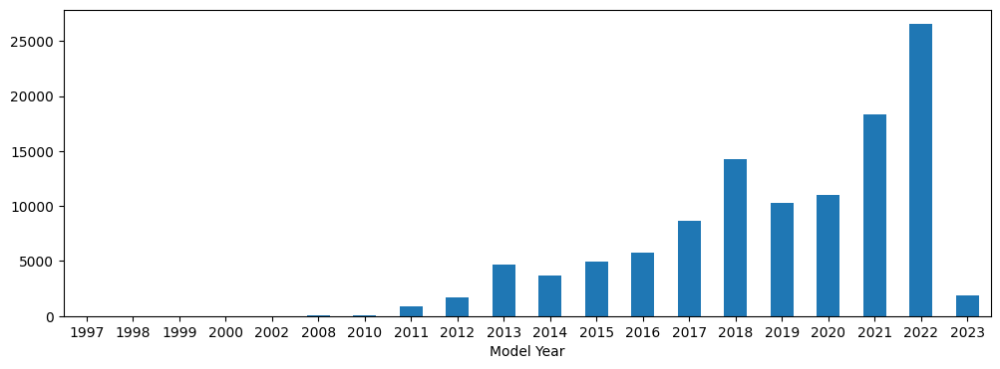

In [34]:

tmpdef_joined_mk_mod['Model Year'] = tmpdf['Model Year']
model_year_counts = tmpdef_joined_mk_mod.groupby('Model Year')['Model Year'].count()
model_year_counts = model_year_counts.sort_index()
model_year_counts.plot(kind='bar', figsize=(12, 4))
plt.xticks(rotation=0)
plt.show()

In [35]:
ser = tmpdf['State'].value_counts()
ser[ser > 10]

,count
State,
WA,112348
CA,76
VA,36
MD,26
TX,14


In [36]:
ser = tmpdf['City'].value_counts()
ser[ser > 10]

,count
City,
Seattle,20305
Bellevue,5921
Redmond,4201
Vancouver,4013
Kirkland,3598
...,...
Alexandria,11
Roslyn,11
Shaw Island,11


** Bivariate Analysis**

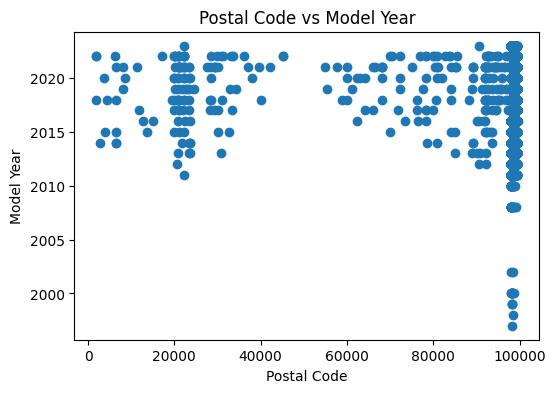

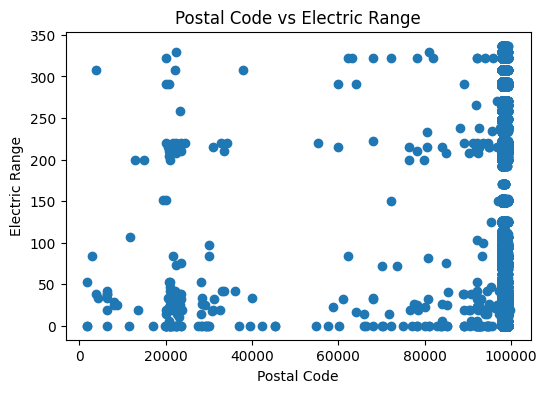

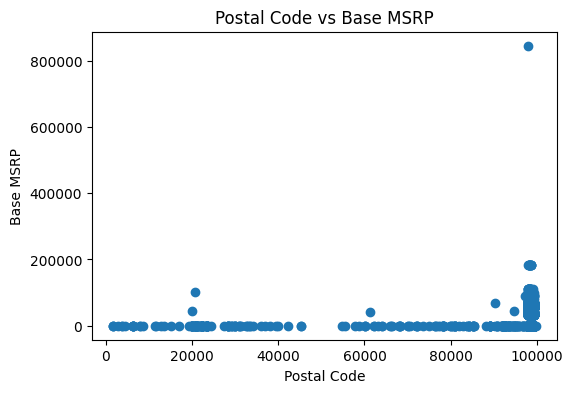

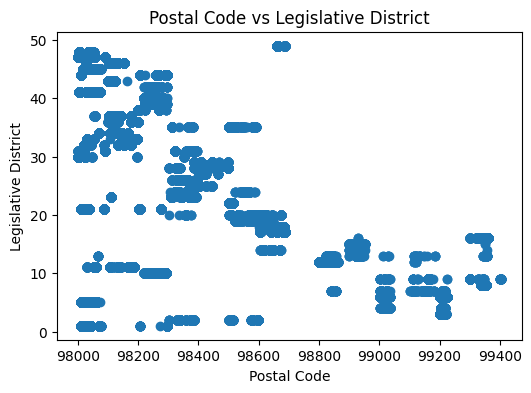

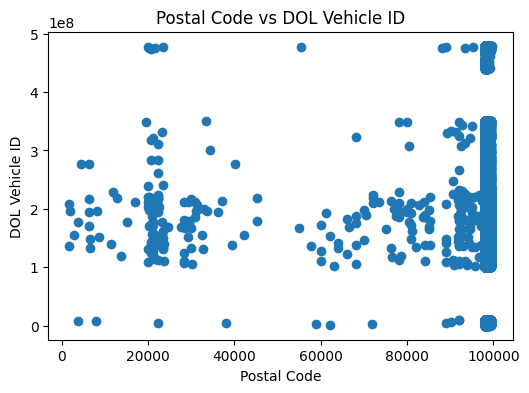

...

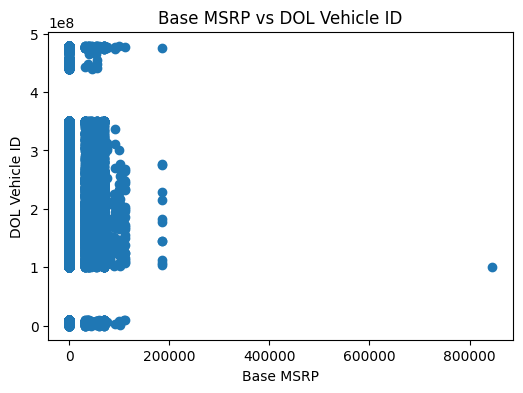

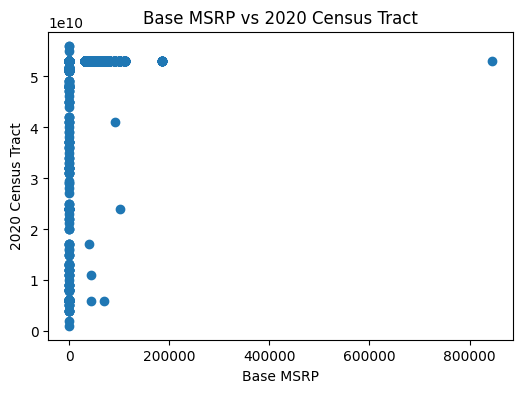

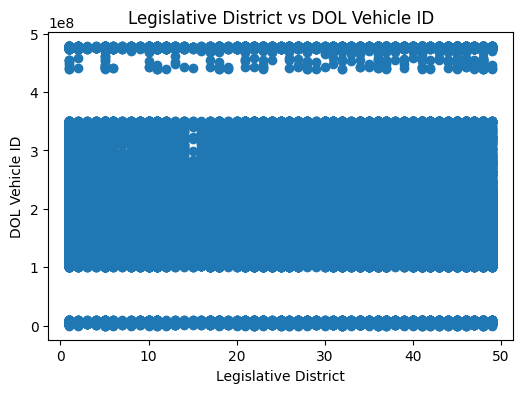

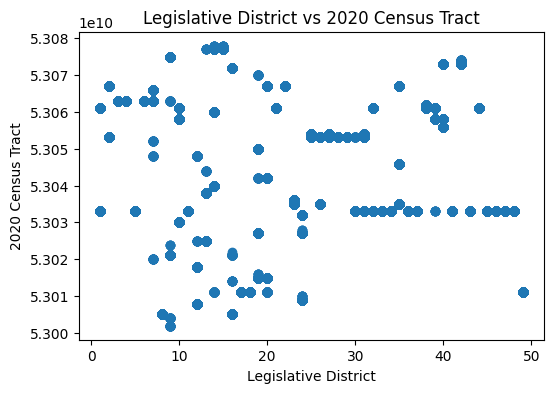

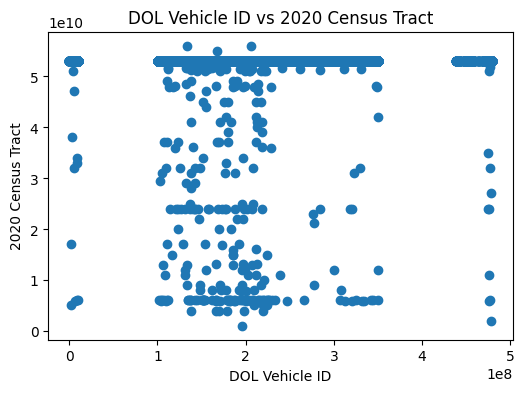

In [39]:
numeric_cols = df.select_dtypes(include=np.number).columns
num_plots = len(numeric_cols)
rows = (num_plots + 2) // 3

for i in range(len(numeric_cols)):
  for j in range(i + 1, len(numeric_cols)):
    plt.figure(figsize=(6, 4))
    plt.scatter(df[numeric_cols[i]], df[numeric_cols[j]])
    plt.xlabel(numeric_cols[i])
    plt.ylabel(numeric_cols[j])
    plt.title(f'{numeric_cols[i]} vs {numeric_cols[j]}')
    plt.show()


/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.

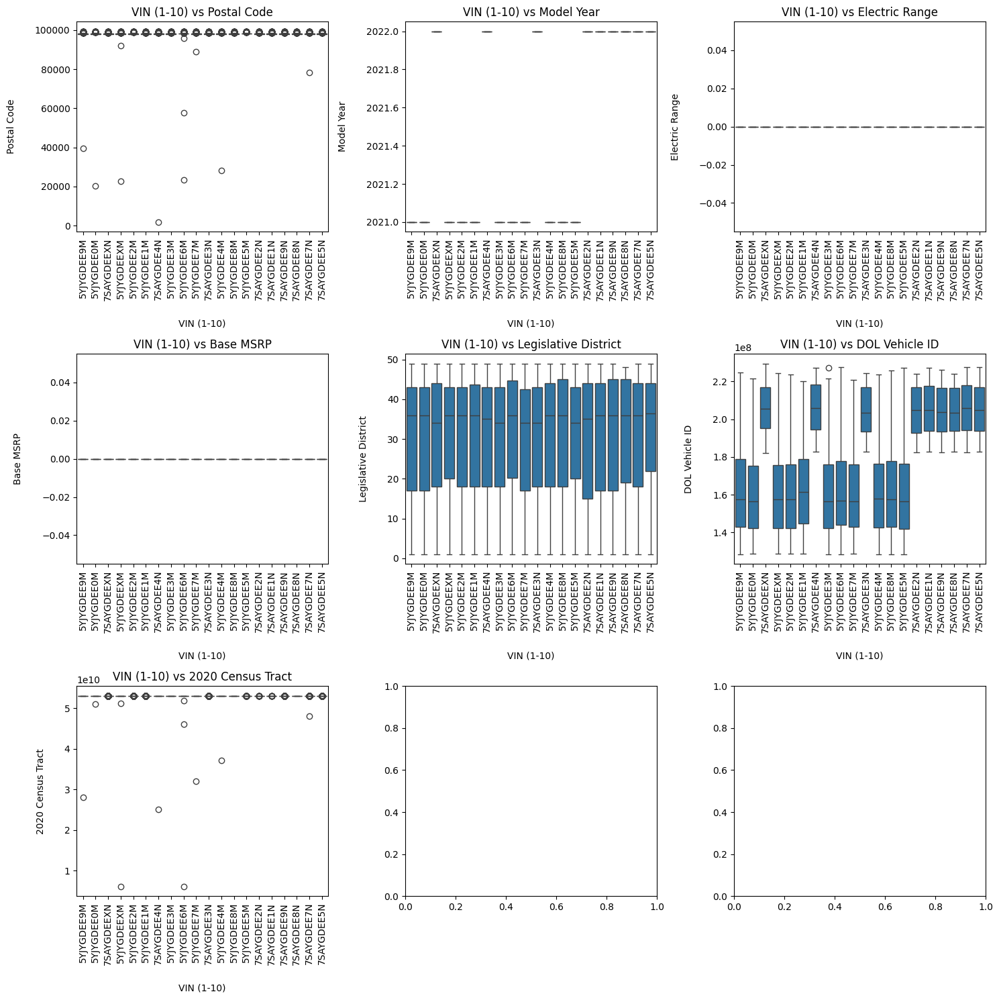

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.

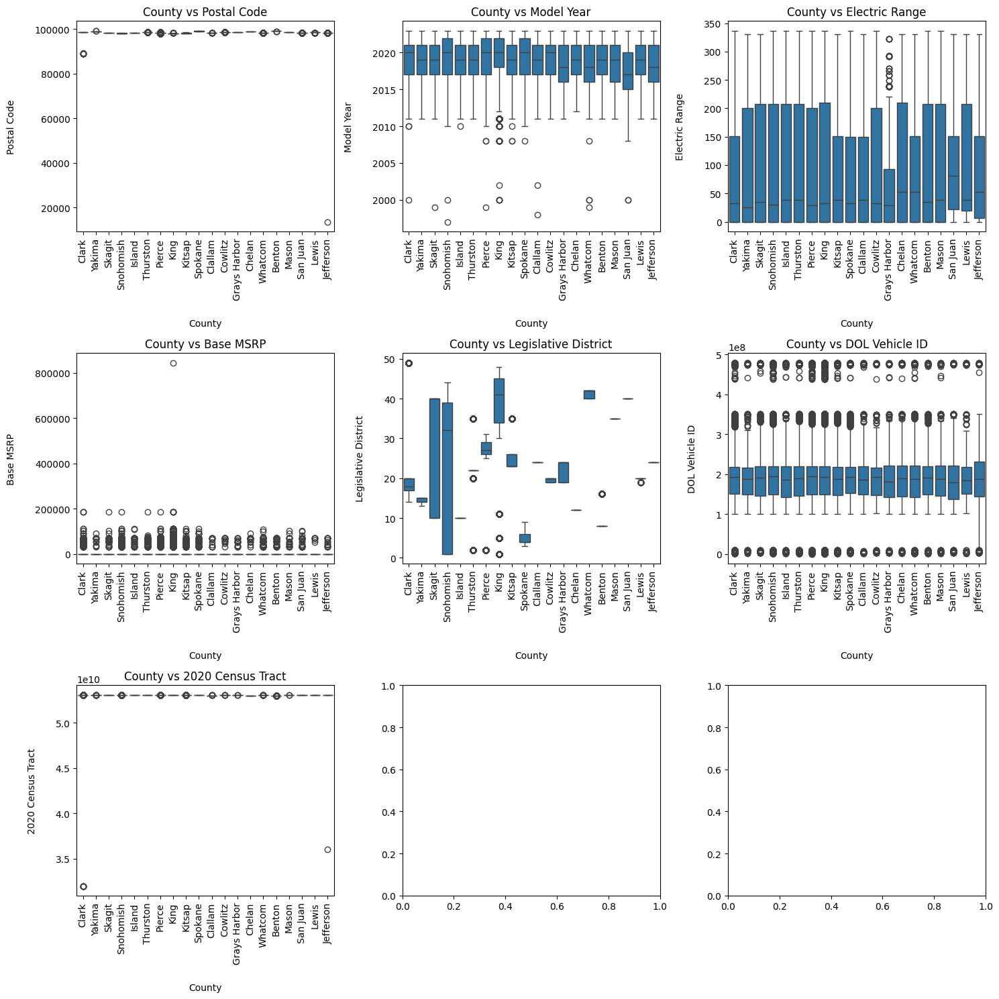

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.

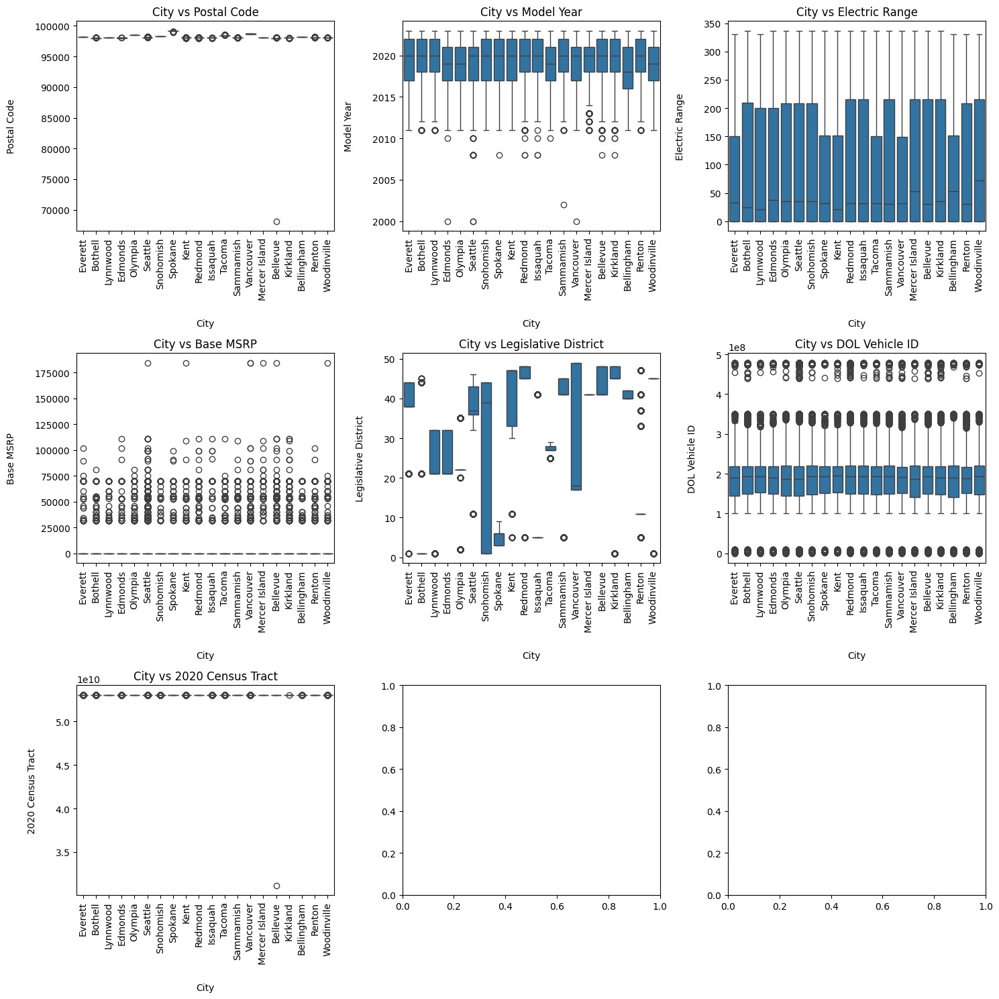

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.

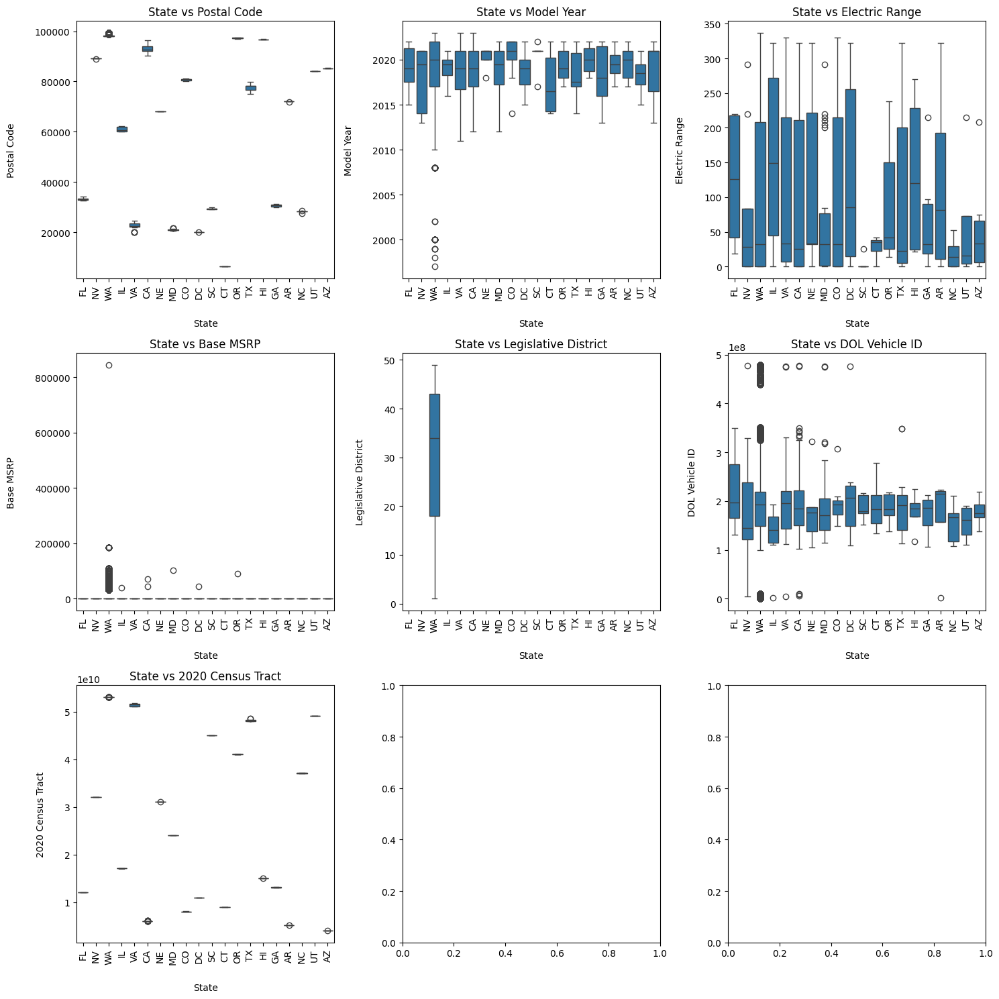

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.

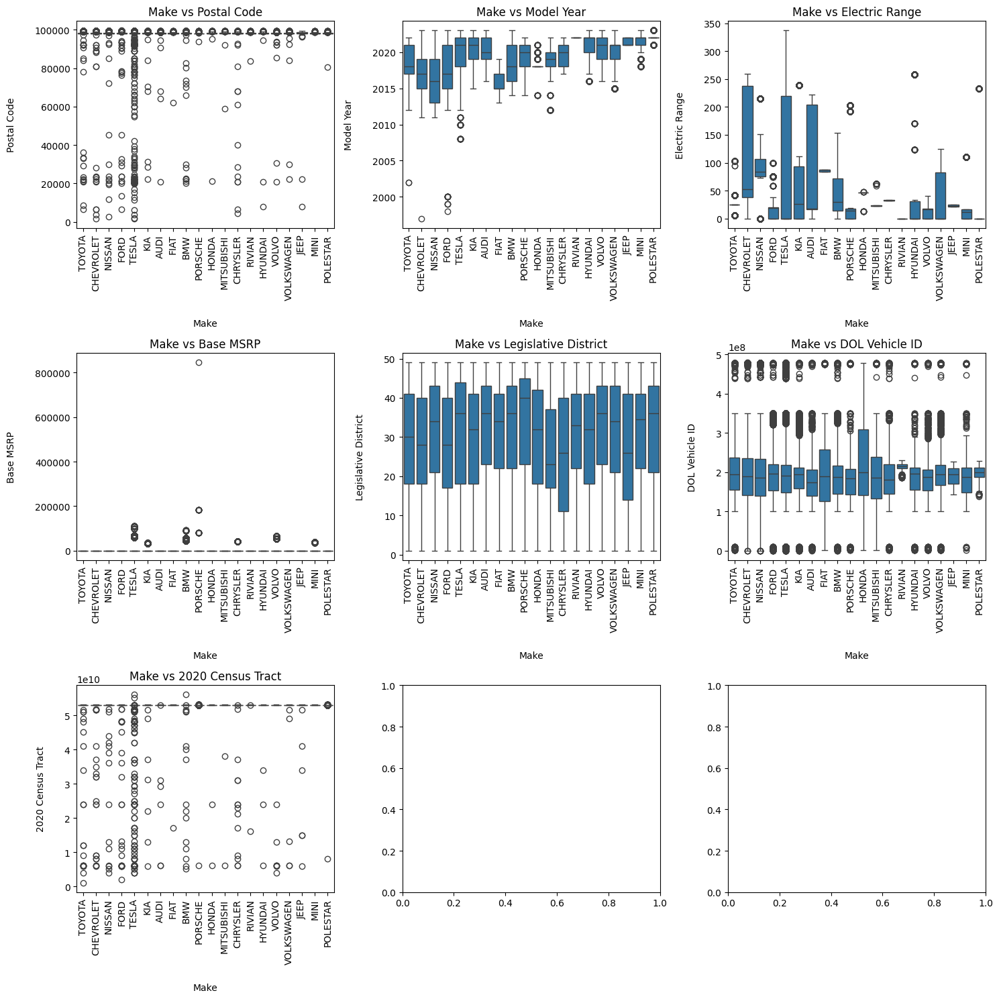

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.

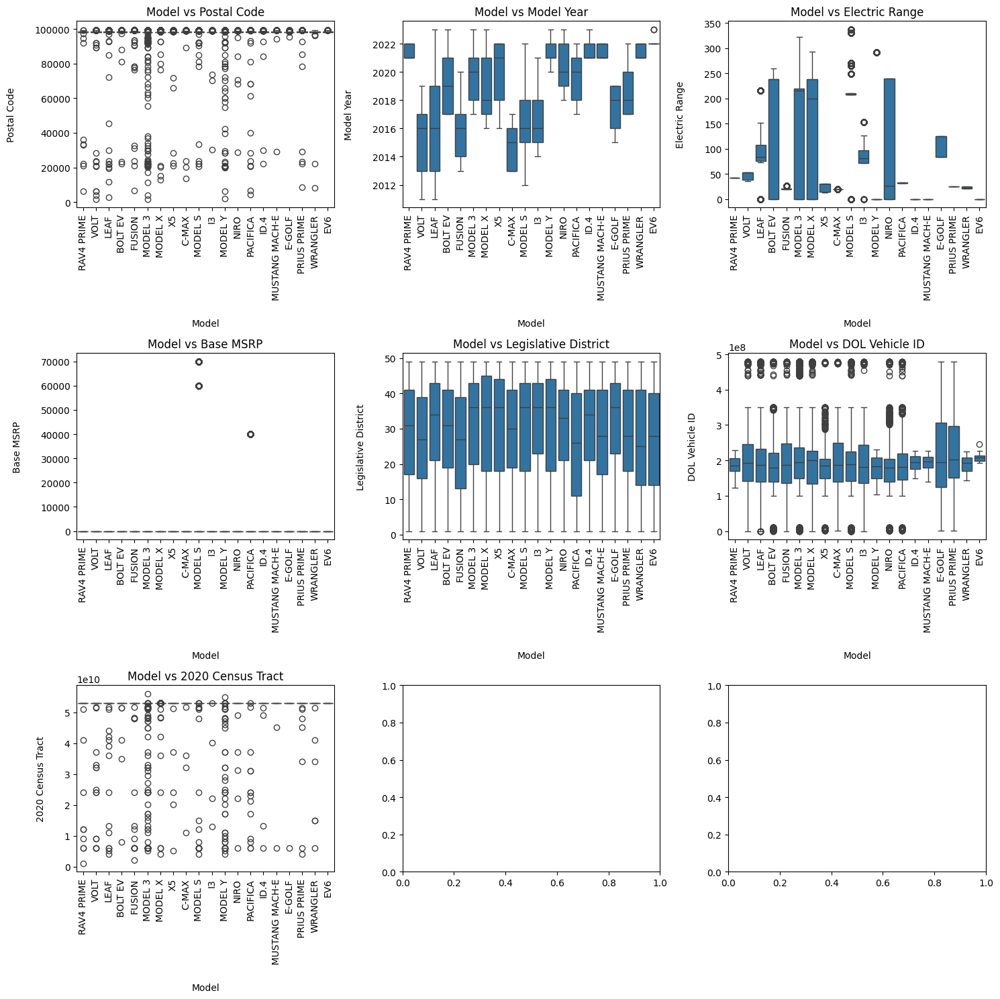

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.

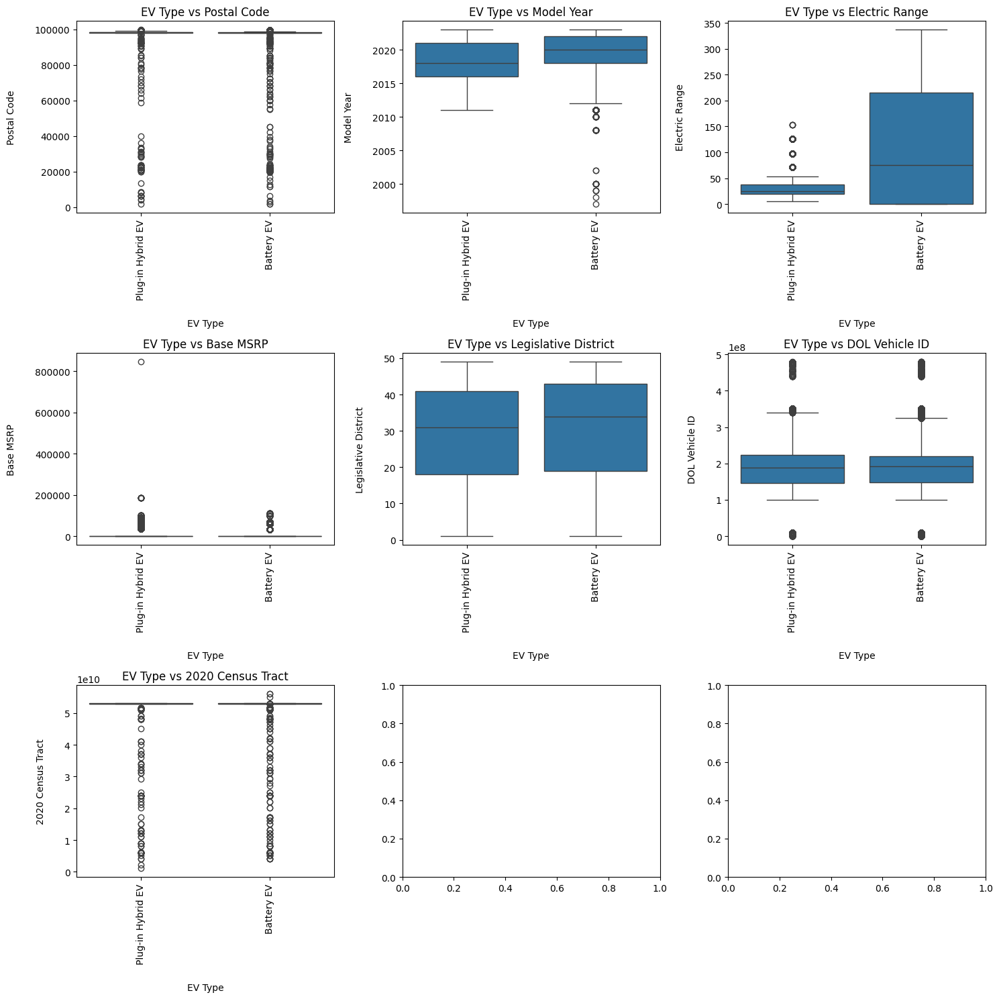

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.

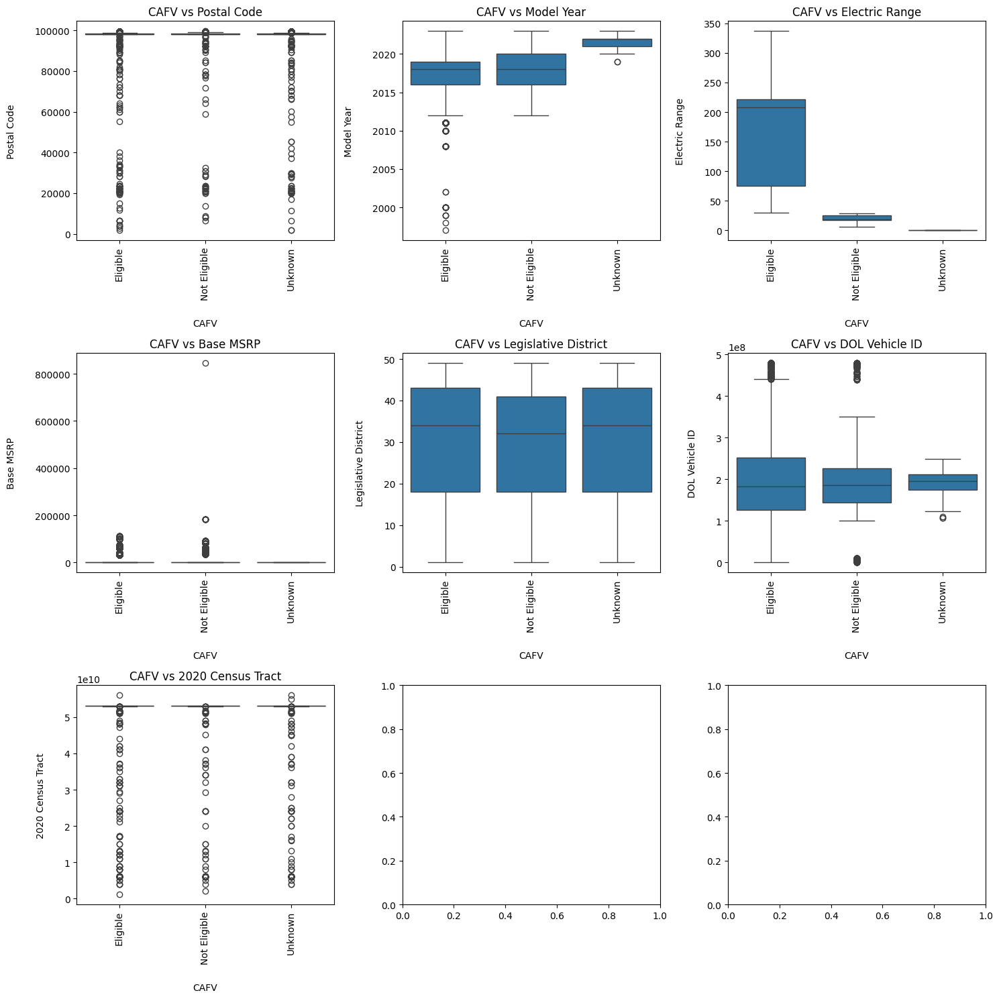

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.

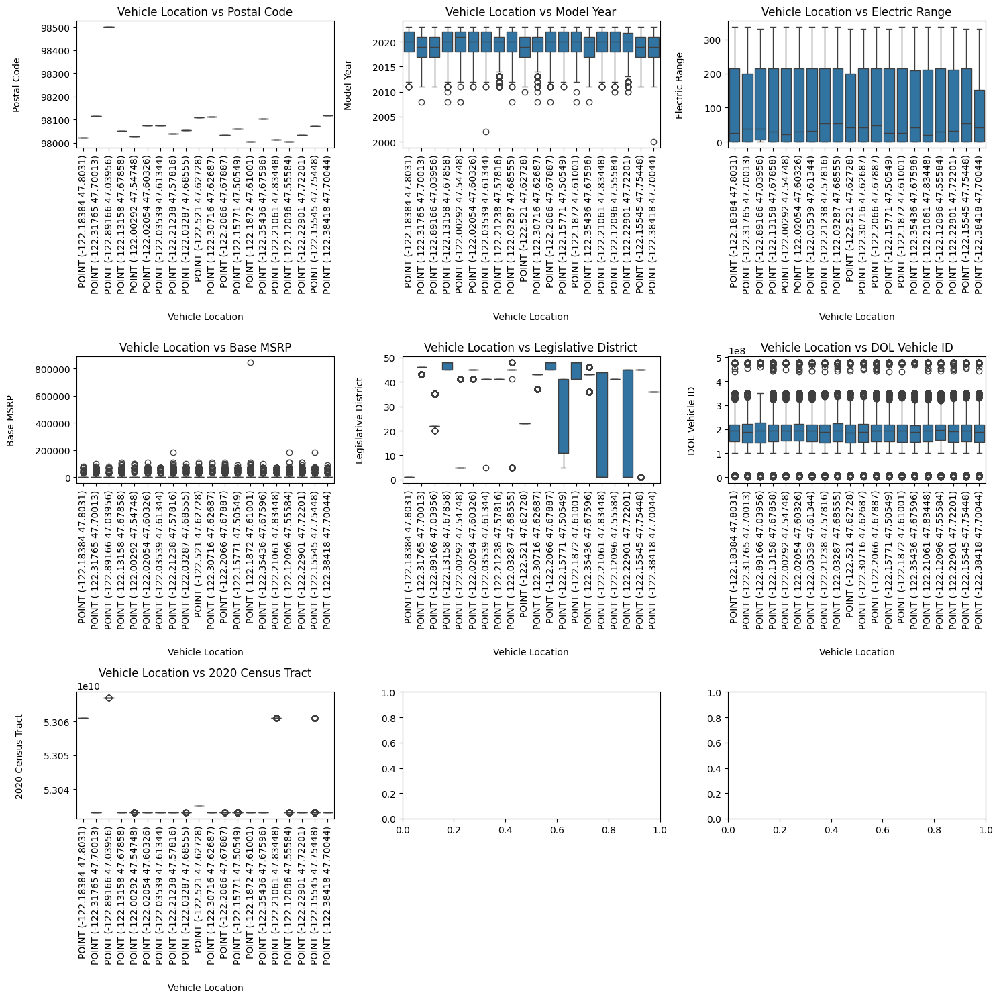

/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.py:640: FutureWarning: SeriesGroupBy.grouper is deprecated and will be removed in a future version of pandas.
  positions = grouped.grouper.result_index.to_numpy(dtype=float)
/usr/local/lib/python3.10/dist-packages/seaborn/categorical.

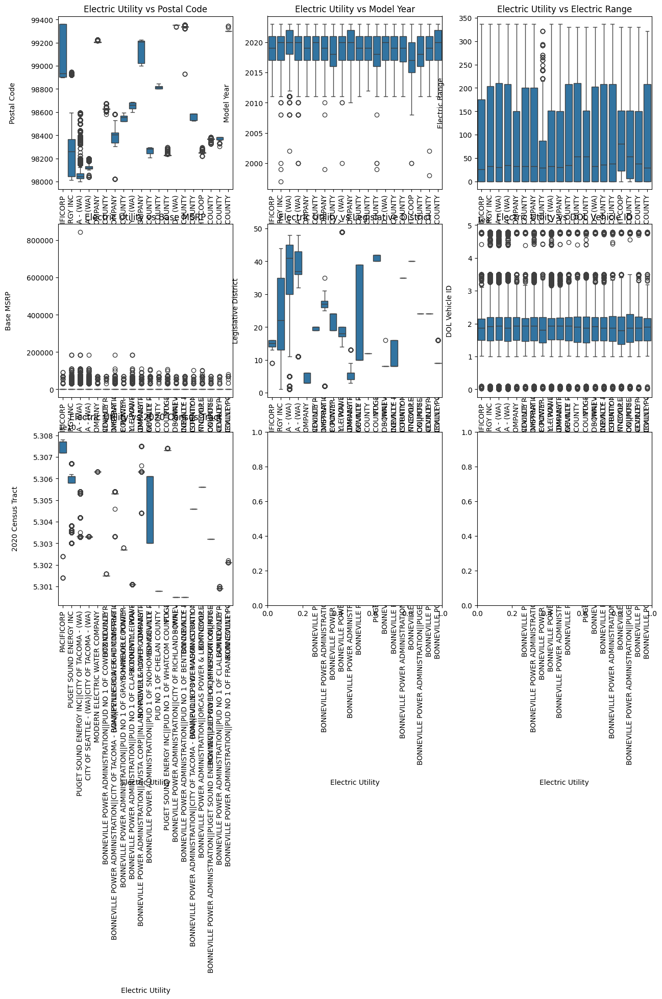

In [40]:
numeric_cols = df.select_dtypes(include=np.number).columns
categorical_cols = df.select_dtypes(include=['object']).columns

for cat_col in categorical_cols:
  top_20_values = df[cat_col].value_counts().nlargest(20).index.tolist()
  filtered_dataset = df[df[cat_col].isin(top_20_values)]

  num_plots = len(numeric_cols)
  rows = (num_plots + 2) // 3

  fig, axes = plt.subplots(rows, 3, figsize=(15, 5 * rows))
  axes = axes.flatten()

  for i, num_col in enumerate(numeric_cols):
    plt.subplot(rows, 3, i + 1)
    sns.boxplot(x=filtered_dataset[cat_col], y=filtered_dataset[num_col])
    plt.title(f"{cat_col} vs {num_col}")
    plt.xticks(rotation=90)
    plt.xlabel(cat_col, labelpad=20)
    plt.ylabel(num_col, rotation=90, labelpad=20)

  plt.tight_layout()
  plt.show()

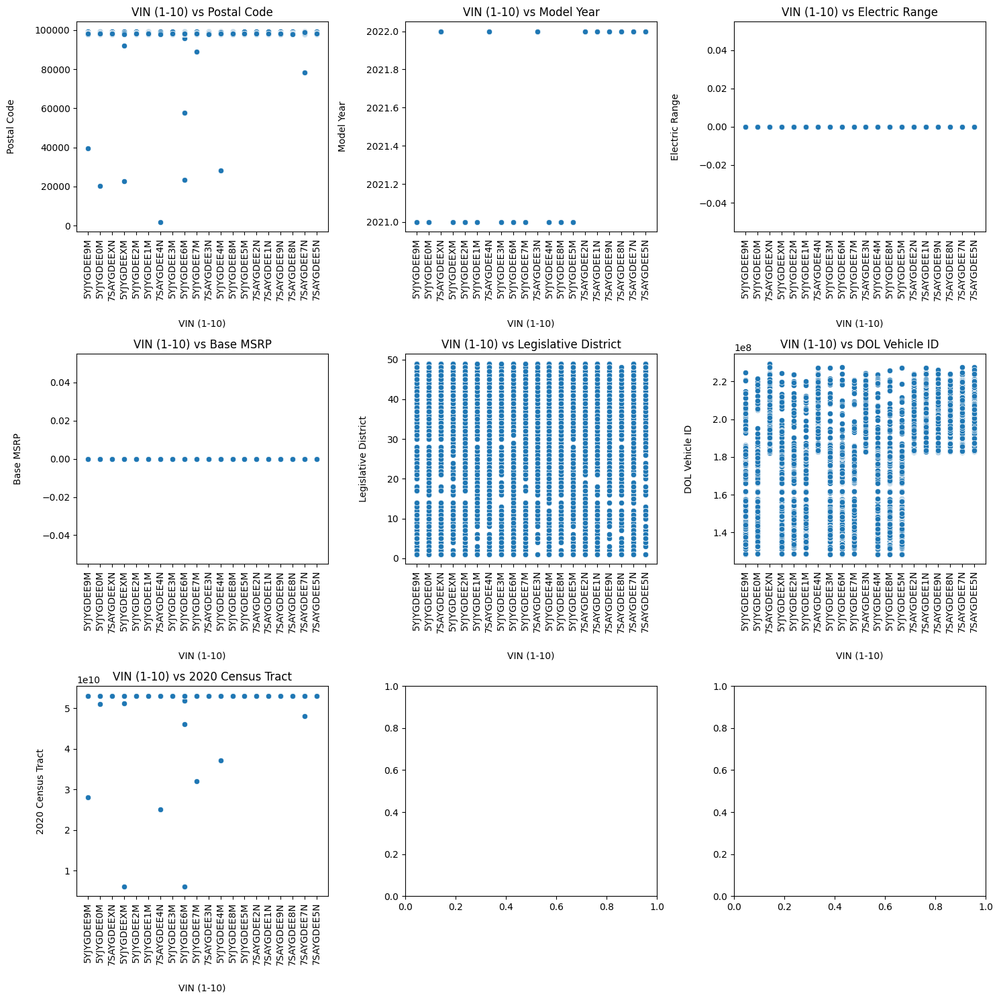

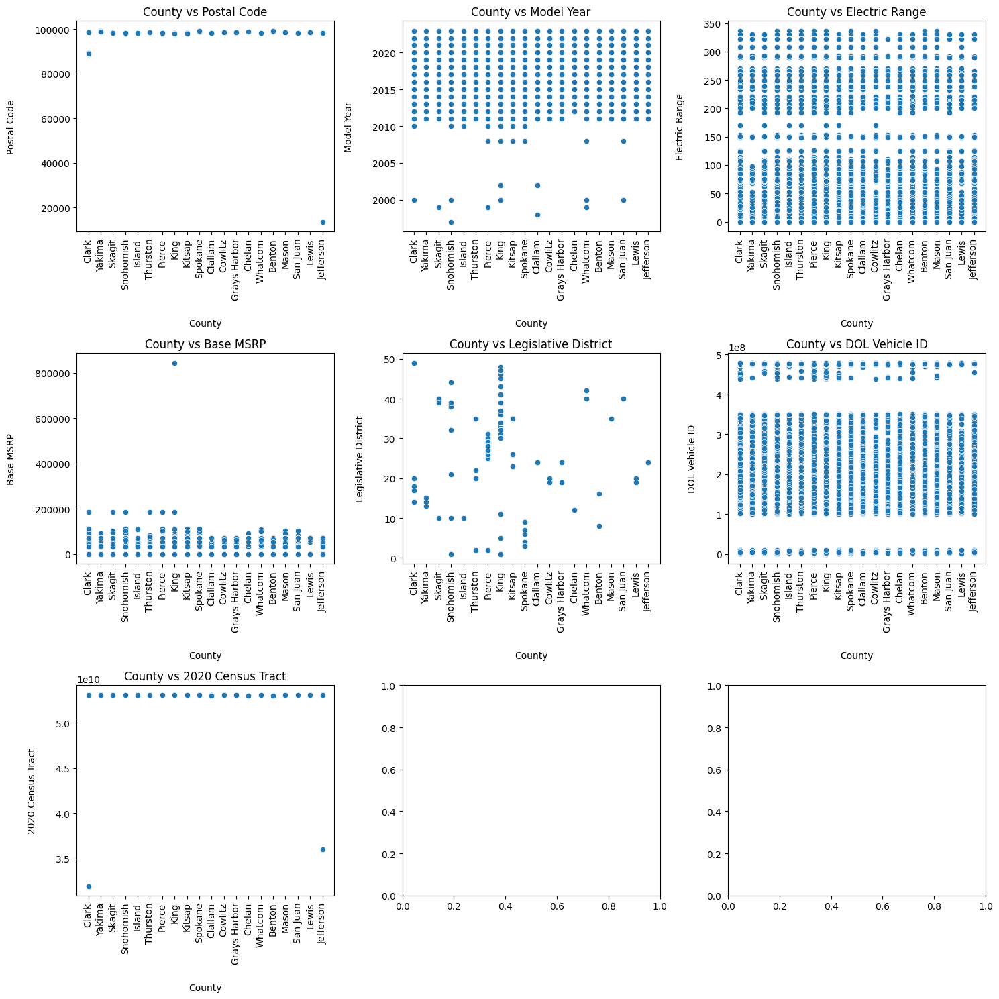

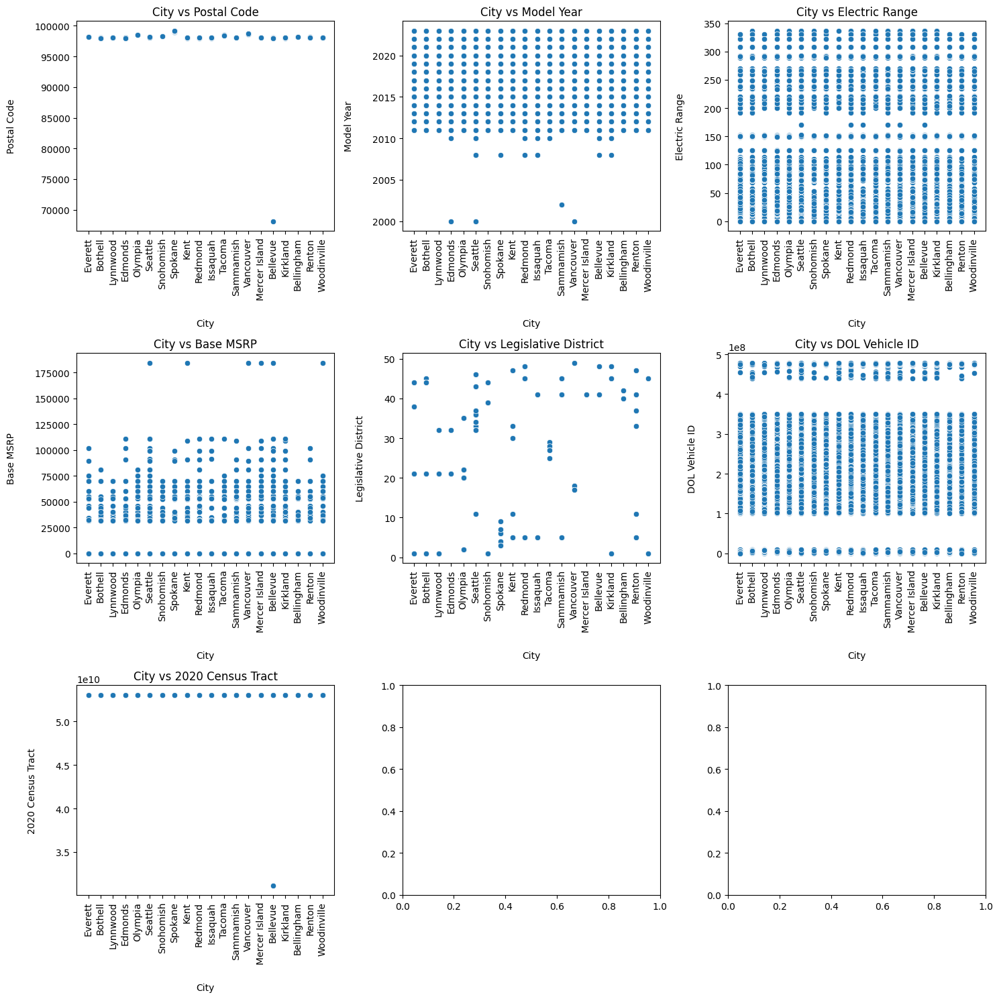

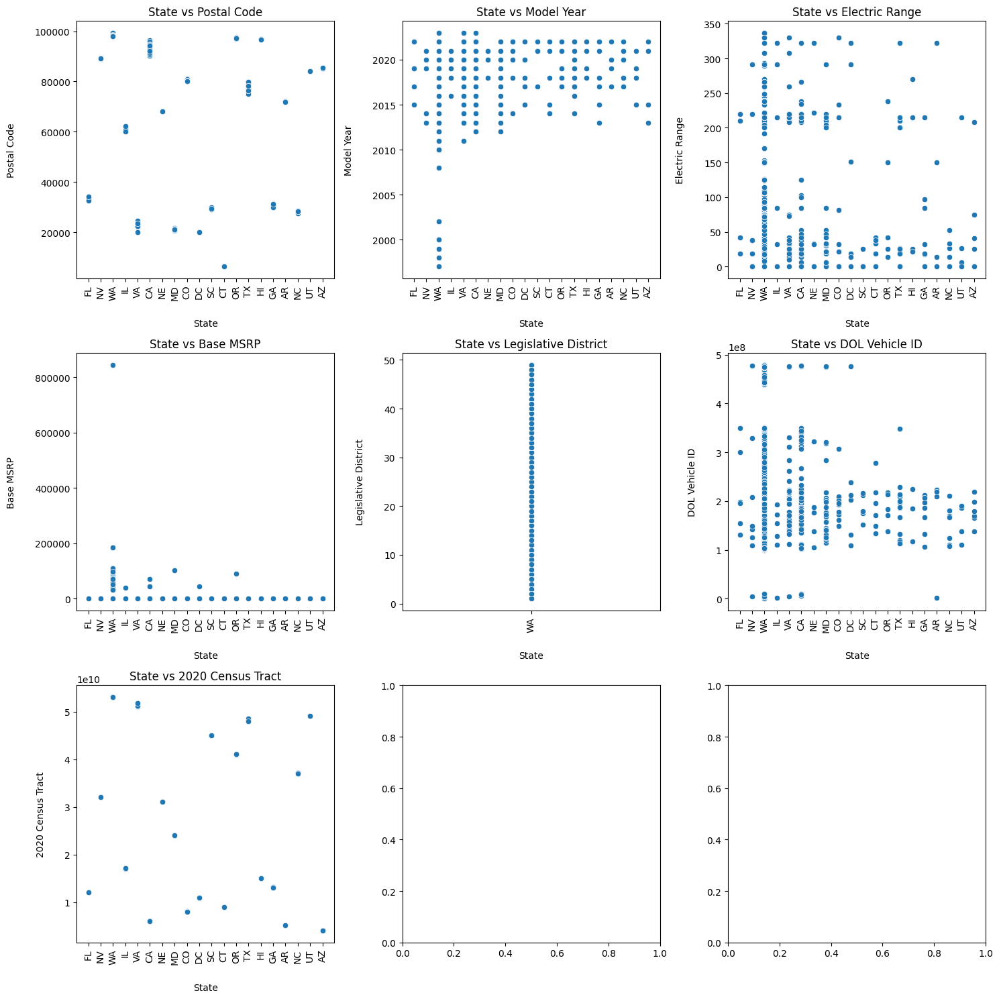

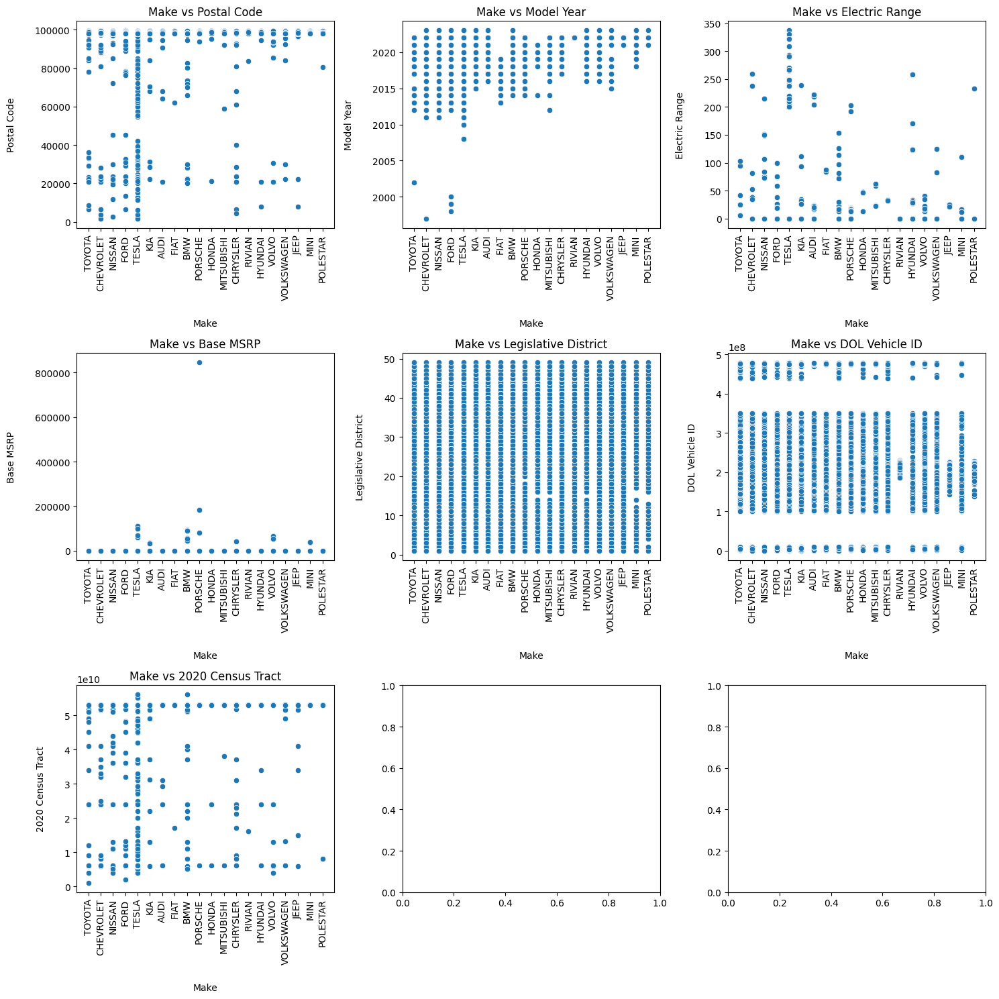

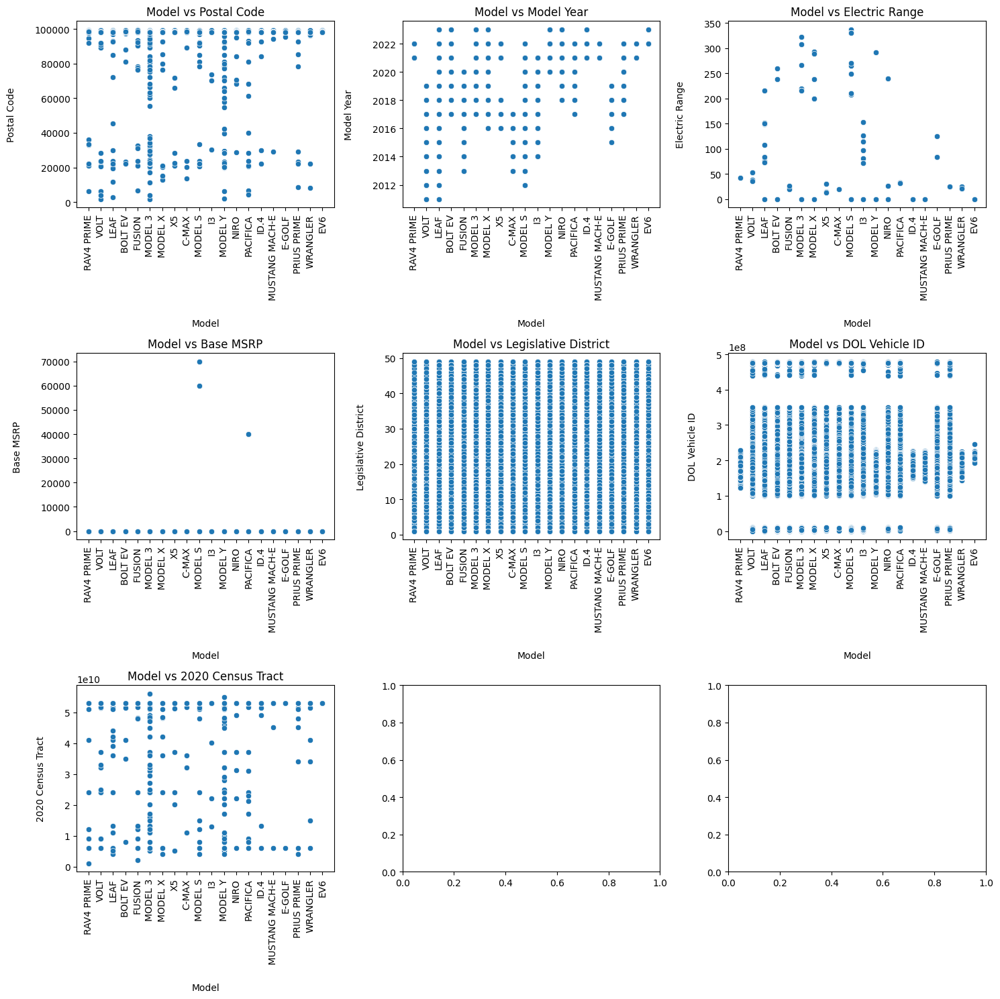

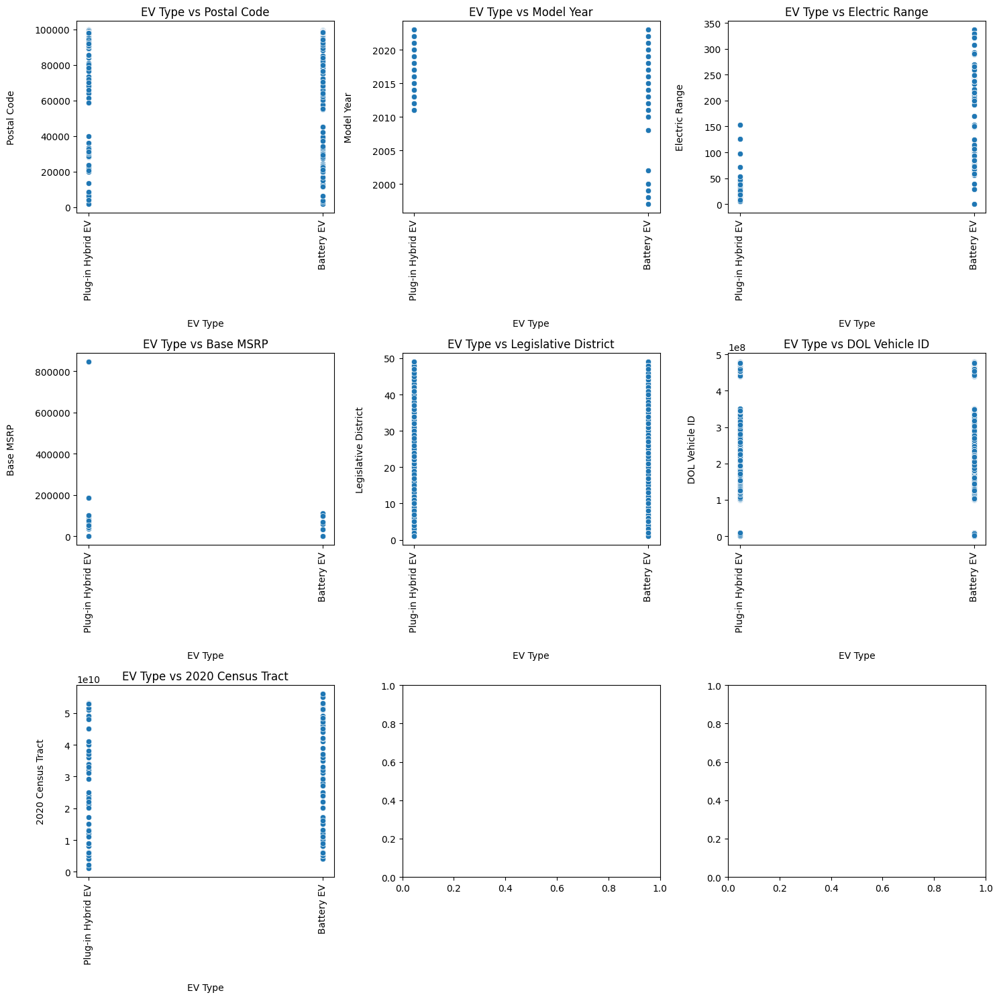

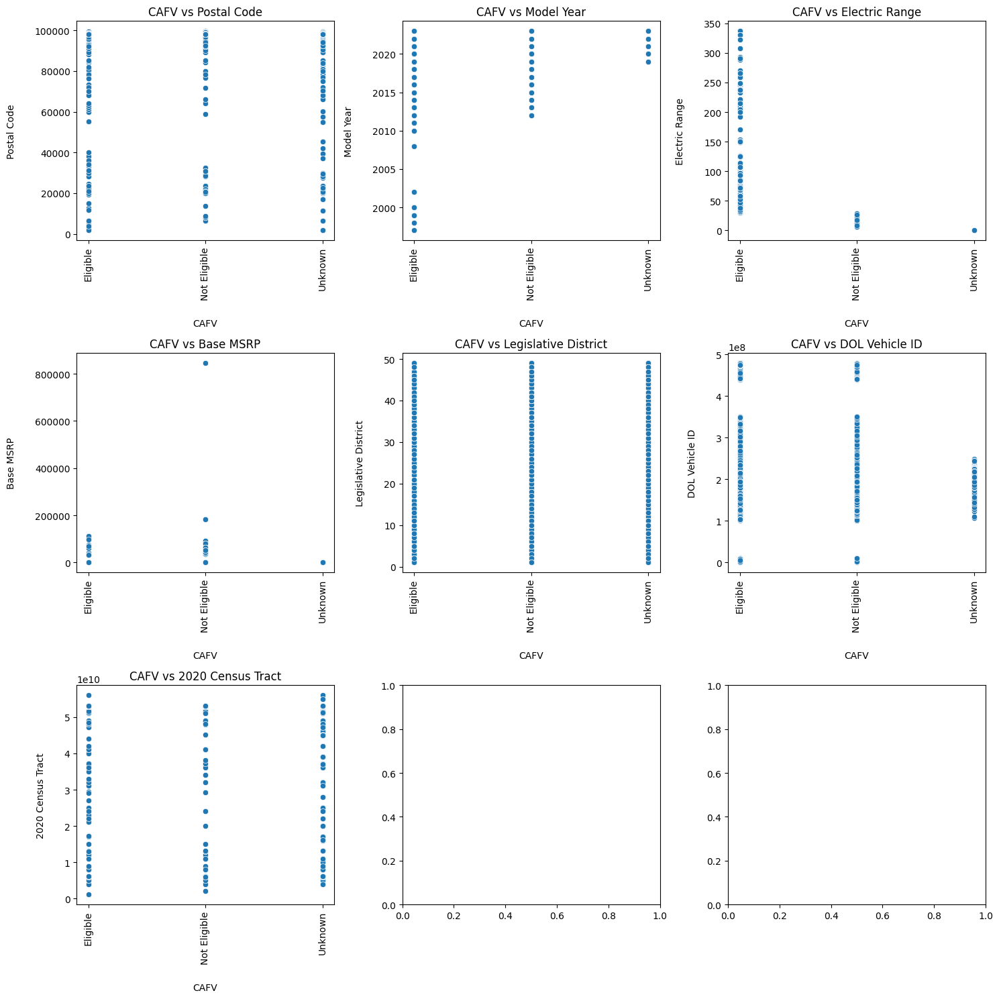

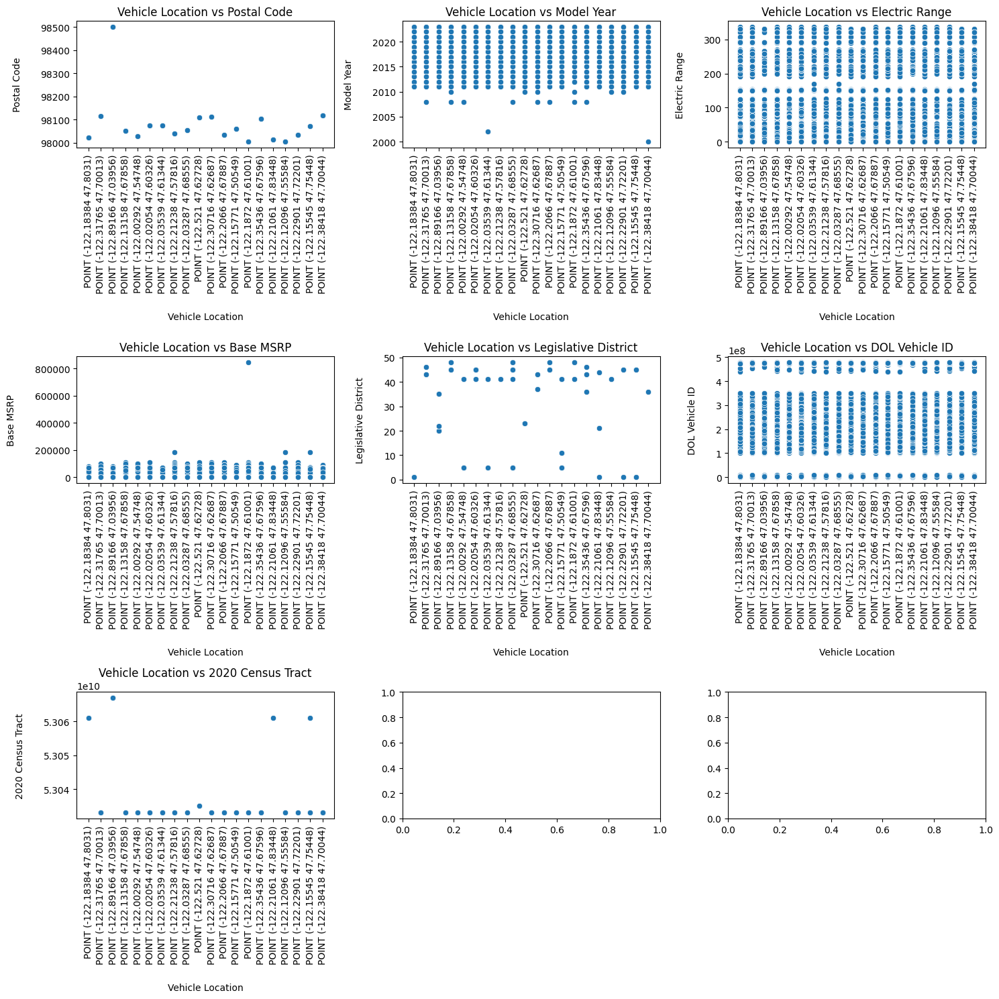

<ipython-input-42-403e04b9c40a>:22: UserWarning: Tight layout not applied. tight_layout cannot make axes height small enough to accommodate all axes decorations.
  plt.tight_layout()


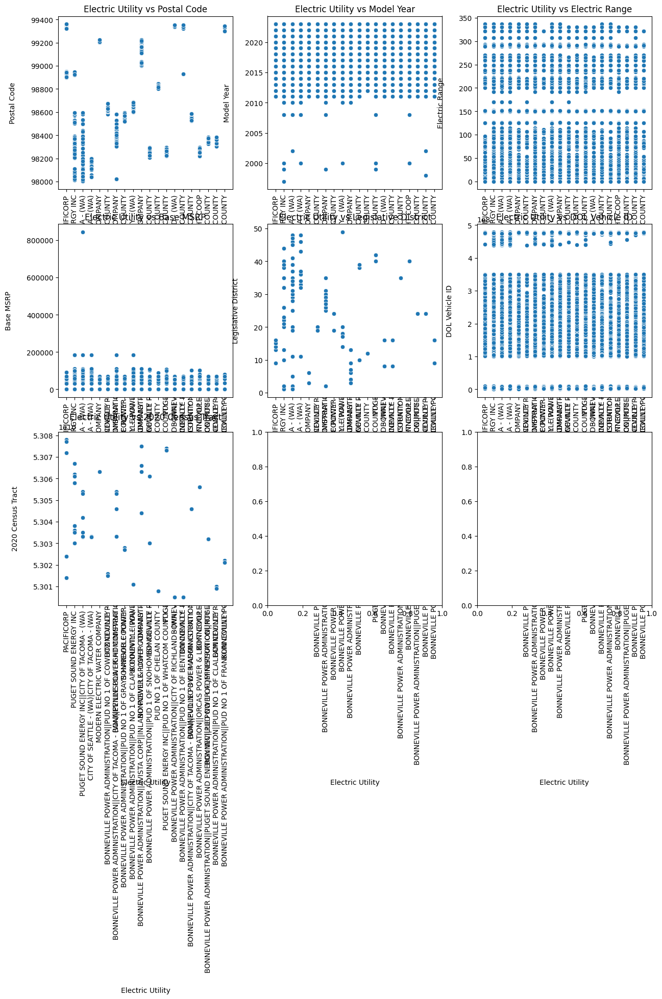

In [42]:
numeric_cols = df.select_dtypes(include=np.number).columns
categorical_cols = df.select_dtypes(include=['object']).columns

for cat_col in categorical_cols:
  top_20_values = df[cat_col].value_counts().nlargest(20).index.tolist()
  filtered_dataset = df[df[cat_col].isin(top_20_values)]

  num_plots = len(numeric_cols)
  rows = (num_plots + 2) // 3

  fig, axes = plt.subplots(rows, 3, figsize=(15, 5 * rows))
  axes = axes.flatten()

  for i, num_col in enumerate(numeric_cols):
    plt.subplot(rows, 3, i + 1)
    sns.scatterplot(x=filtered_dataset[cat_col], y=filtered_dataset[num_col])
    plt.title(f"{cat_col} vs {num_col}")
    plt.xticks(rotation=90)
    plt.xlabel(cat_col, labelpad=20)
    plt.ylabel(num_col, rotation=90, labelpad=20)

  plt.tight_layout()
  plt.show()


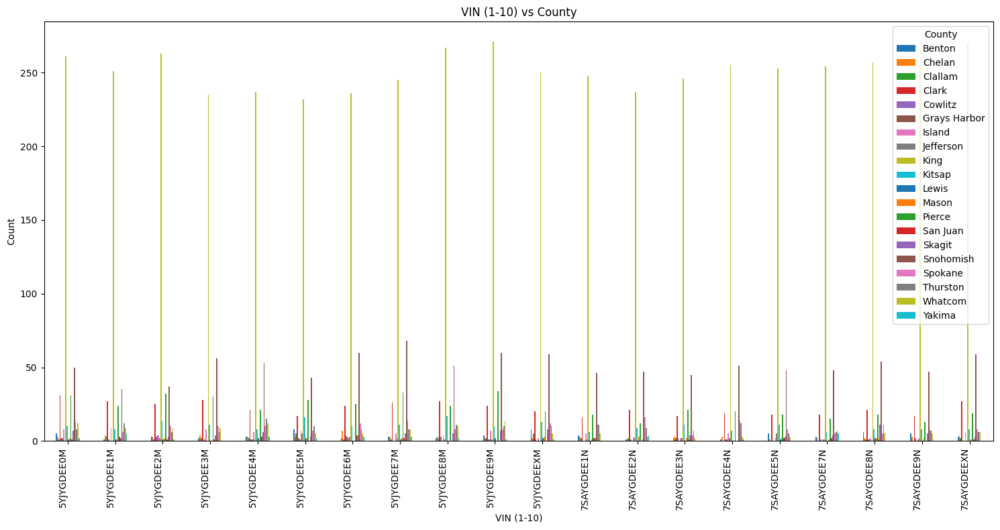

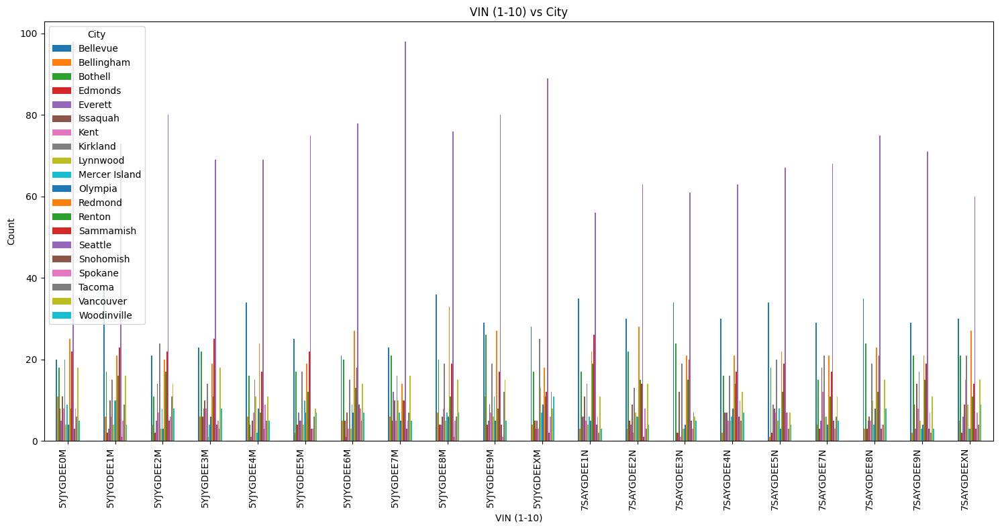

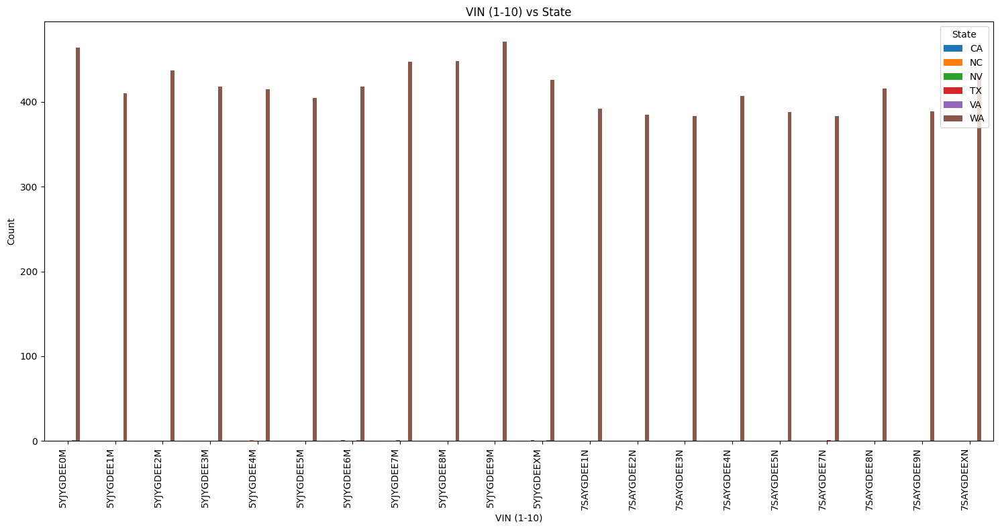

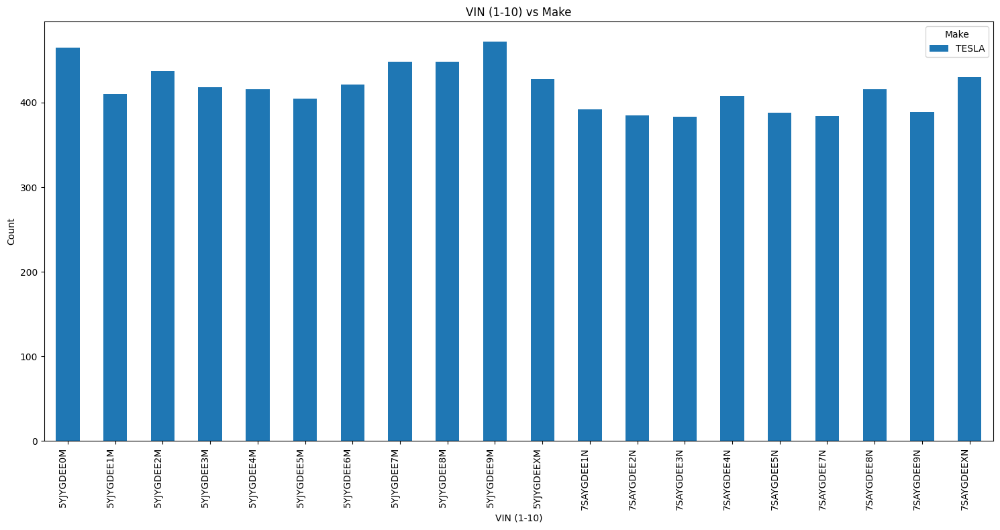

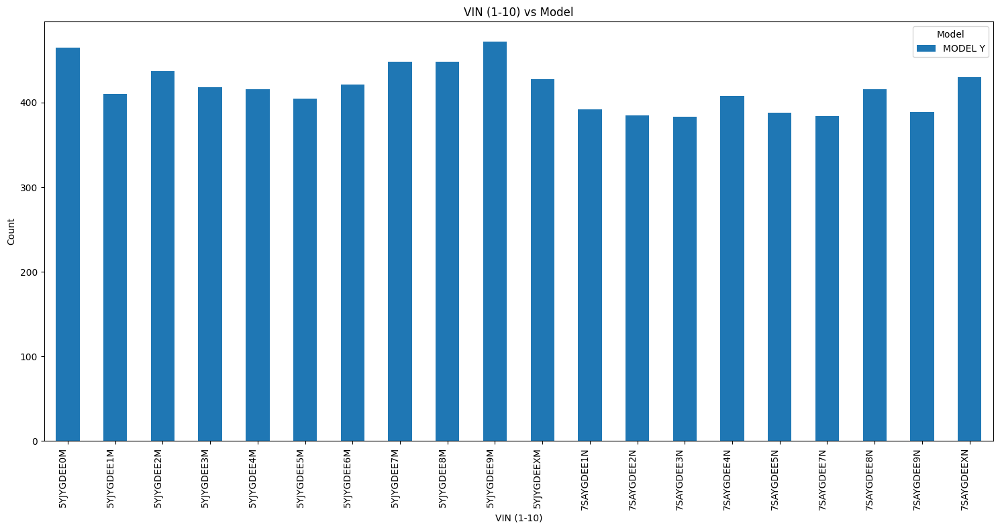

...

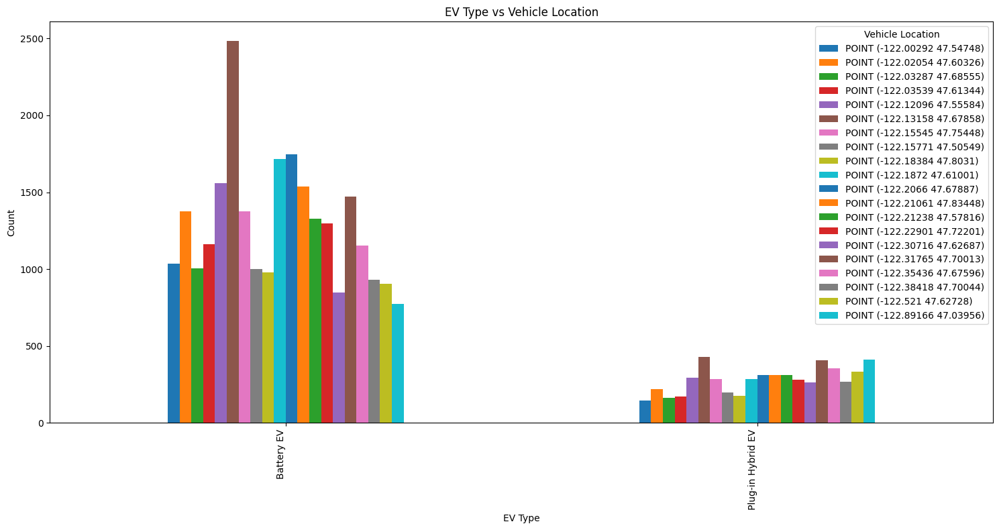

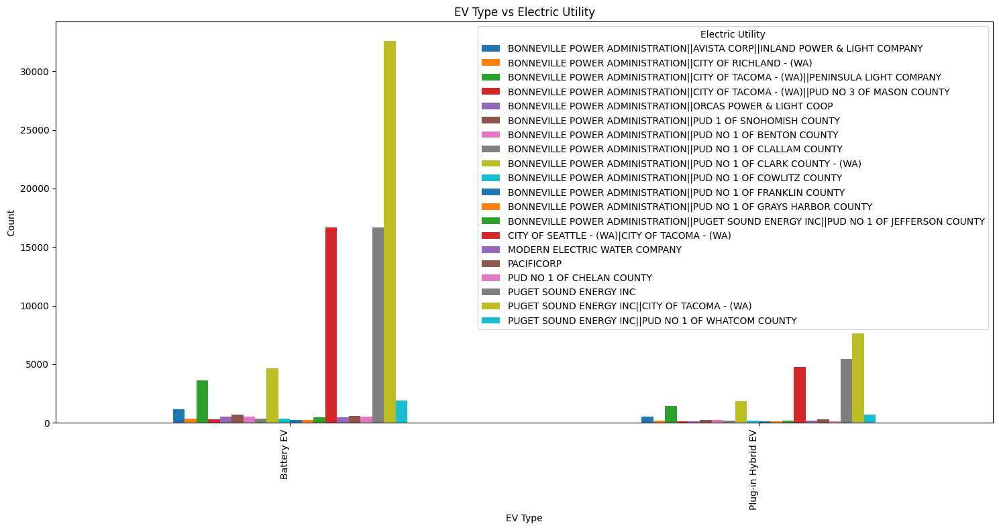

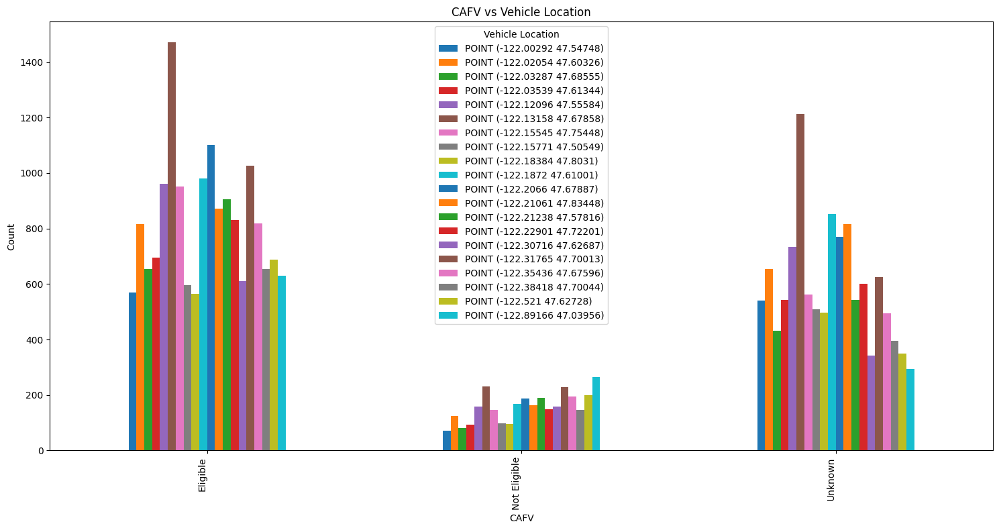

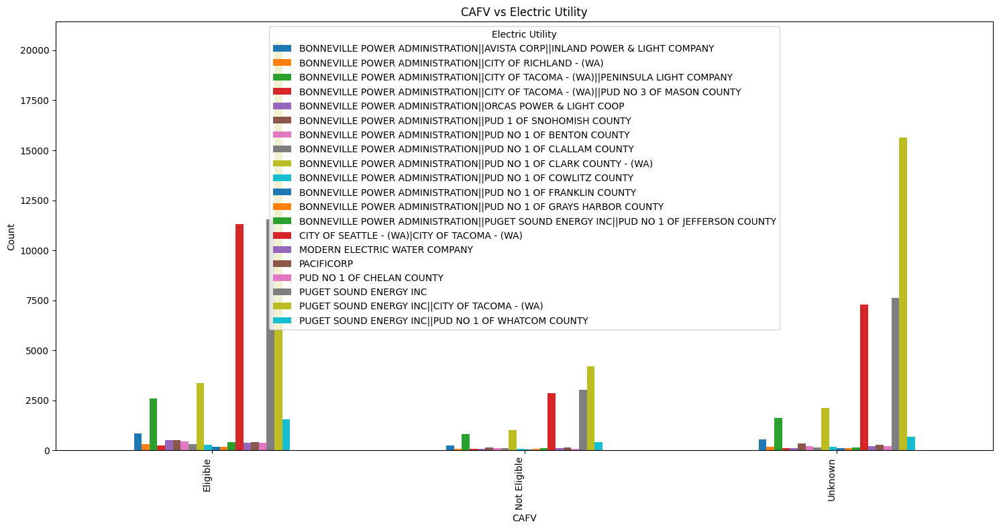

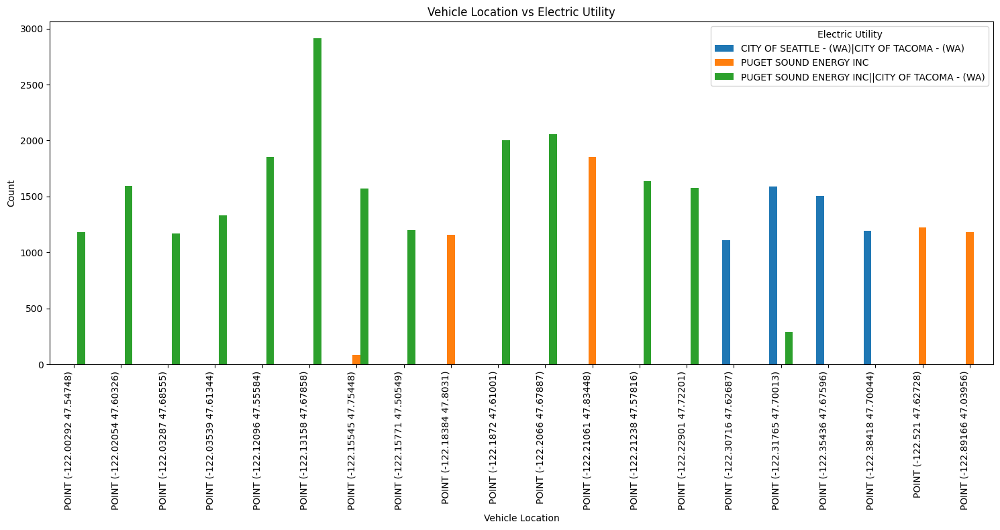

In [43]:
categorical_cols = df.select_dtypes(include=['object']).columns

for i in range(len(categorical_cols)):
  for j in range(i + 1, len(categorical_cols)):
    # Select the top 20 values for each categorical column
    top_20_col_i = df[categorical_cols[i]].value_counts().nlargest(20).index.tolist()
    top_20_col_j = df[categorical_cols[j]].value_counts().nlargest(20).index.tolist()

    # Filter the dataset to include only the top 20 values for both columns
    filtered_dataset = df[
        df[categorical_cols[i]].isin(top_20_col_i) & df[categorical_cols[j]].isin(top_20_col_j)
    ]

    # Create a cross-tabulation of the two categorical columns
    cross_tab = pd.crosstab(filtered_dataset[categorical_cols[i]], filtered_dataset[categorical_cols[j]])

    # Plot the grouped bar plot
    cross_tab.plot(kind='bar', figsize=(15, 8))
    plt.title(f"{categorical_cols[i]} vs {categorical_cols[j]}")
    plt.xlabel(categorical_cols[i])
    plt.ylabel("Count")
    plt.xticks(rotation=90, ha="right")
    plt.legend(title=categorical_cols[j])
    plt.tight_layout()
    plt.show()

# Task 2

In [44]:
data=pd.read_csv('/content/dataset.csv')
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 112634 entries, 0 to 112633
Data columns (total 17 columns):
 #   Column                                             Non-Null Count   Dtype  
---  ------                                             --------------   -----  
 0   VIN (1-10)                                         112634 non-null  object 
 1   County                                             112634 non-null  object 
 2   City                                               112634 non-null  object 
 3   State                                              112634 non-null  object 
 4   Postal Code                                        112634 non-null  int64  
 5   Model Year                                         112634 non-null  int64  
 6   Make                                               112634 non-null  object 
 7   Model                                              112614 non-null  object 
 8   Electric Vehicle Type                              112634 non-null  object

In [45]:
state_ev_counts = data.groupby('State').size().reset_index(name='EV_Count')

In [46]:
fig = px.choropleth(
    data_frame=state_ev_counts,
    locations='State',
    locationmode='USA-states',
    color='EV_Count',
    scope="usa",
    color_continuous_scale="Viridis",
    title="Number of Electric Vehicles by State",
    labels={'EV_Count': 'Number of EVs'}
)
fig.show()

### **Task 3**

In [59]:

df_bcr = df.groupby(['Model Year', 'Make'])['Make'].count().unstack().fillna(0)
bcr.bar_chart_race(
    df=df_bcr,
    filename='ev_barchart.mp4',
    orientation='h',
    sort='desc',
    n_bars=12,
    fixed_order=False,
    filter_column_colors=True,
    fixed_max=True,
    steps_per_period=15,
    interpolate_period=True,
    label_bars=True,
    bar_size=0.85,
    period_label={'x': .98, 'y': .3, 'ha': 'right', 'va': 'center'},
    period_fmt='{x:.0f}',
    title='Evolution of Electric Vehicle Manufacturers (Yearly)',
    title_size=16,
    cmap='plasma',
    dpi=150,
    fig=None,
    bar_kwargs={'alpha': .85},
)


/usr/local/lib/python3.10/dist-packages/bar_chart_race/_make_chart.py:286: UserWarning:

FixedFormatter should only be used together with FixedLocator

/usr/local/lib/python3.10/dist-packages/bar_chart_race/_make_chart.py:287: UserWarning:

FixedFormatter should only be used together with FixedLocator

